<a href="https://colab.research.google.com/github/WeiShi78/MIR-Final-Project-AMT/blob/main/MIR_FINAL_PROJ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Scope
## In this project, users are free to try generating accompaniment/continuation or synthesizing timbres given MIDI files. Users can also generate a piece from scratch. In the timbre synthesis part, since the midi2paras model can not be run successfully, Fluidsynth is used instead.

# Data Used
## Coconet training data: Bach Chorale MIDI files
## Coconet and MusetNet inputs:  MIDI file
## Coconet and MuseNet outputs: MIDI file and audio file
## MIDI-DDSP training data: the URMP dataset
## MIDI-DDSP/Fluidsynth input data: MIDI file
## MIDI-DDSP/Fluidsynth output data: audio file

# Setting Up the Environment

In [1]:
! git clone https://github.com/lukewys/coconet-pytorch.git
! pip install pretty_midi midi2audio pyfluidsynth 
! pip install requests # for MuseNet API requests
! apt install fluidsynth # Pip does not work for some reason. Only apt works

Cloning into 'coconet-pytorch'...
remote: Enumerating objects: 24, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 24 (delta 7), reused 18 (delta 4), pack-reused 0
Unpacking objects: 100% (24/24), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.6 MB 7.2 MB/s 
     |████████████████████████████████| 51 kB 1.6 MB/s 
  Created wheel for pretty-midi: filename=pretty_midi-0.2.9-py3-none-any.whl size=5591954 sha256=2f98473750c5ddd9a3384b6c395908d674628a3d7c78c3dc34a6a317e005422c
  Stored in directory: /root/.cache/pip/wheels/2a/5a/e3/30eeb9a99350f3f7e21258fcb132743eef1a4f49b3505e76b6
Successfully built pretty-midi
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package w

In [2]:
import os
import numpy as np
from IPython.display import display, Audio
os.chdir('coconet-pytorch')
from coconet import *

# Auto-Accompaniment



In [3]:
#@title Download the Training Data (Bach Chorales)
! wget https://github.com/czhuang/JSB-Chorales-dataset/raw/master/Jsb16thSeparated.npz

--2022-12-05 19:56:20--  https://github.com/czhuang/JSB-Chorales-dataset/raw/master/Jsb16thSeparated.npz
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/czhuang/JSB-Chorales-dataset/master/Jsb16thSeparated.npz [following]
--2022-12-05 19:56:20--  https://raw.githubusercontent.com/czhuang/JSB-Chorales-dataset/master/Jsb16thSeparated.npz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 102808 (100K) [application/octet-stream]
Saving to: ‘Jsb16thSeparated.npz’

Jsb16thSeparated.np 100%[===================>] 100.40K  --.-KB/s    in 0.002s  

2022-12-05 19:56:21 (58.8 MB/s) - ‘Jsb16thSeparated.npz

In [15]:
#@title Train the Coconet model (optional)
#@markdown See original paper here: https://magenta.tensorflow.org/coconet
# ! python train.py

In [4]:
#@title Upload Input MIDI files to generate
#@markdown Custom MIDI or generate from scratch
generate_from_scratch = True #@param {type:"boolean"}
custom_midi_path = "/content/coconet-pytorch/catechor.mid" #@param {type:"string"}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
n_layers = 64
hidden_size = 128
model = Net(n_layers, hidden_size).to(device)
model.load_state_dict(torch.load('pretrained.pt'))

if generate_from_scratch:
  data = np.load('Jsb16thSeparated.npz', encoding='bytes', allow_pickle=True)
  test_sample = data['valid'][0].transpose()[:, :128]
  test_sample_melody = test_sample[0]
  # print(test_sample_melody)
  harmonize_melody_and_save_midi(test_sample_melody, 0, model, device)
else:
  input = pretty_midi.PrettyMIDI(custom_midi_path)
  melody = []
  notes = input.instruments[0].notes
  # print(notes)
  for note in notes:
    dur = note.end - note.start
    if dur > 0.3:
      melody.extend([note.pitch for i in range(int(dur / 0.3))])
    melody.append(note.pitch)
  # print(melody)
  melody = melody[0:128]
  harmonize_melody_and_save_midi(melody, 0, model, device)

In [5]:
#@title Listen to the output!
Audio(filename='/content/coconet-pytorch/results/generated_midi/harmonize_val_set_step_00000.wav')

# Music Continuation

In [6]:
#@title Install dependecies
os.chdir('/content/')
!git clone https://github.com/asigalov61/tegridy-tools
import secrets
import requests # for MuseNet API
import copy
import json
os.chdir('/content/tegridy-tools/tegridy-tools')
import TMIDIX # for MIDI processing
# for plotting/listening only
import matplotlib.pyplot as plt
from midi2audio import FluidSynth
import matplotlib.pyplot as plt
os.chdir('/content/')

Cloning into 'tegridy-tools'...
remote: Enumerating objects: 2623, done.
remote: Counting objects: 100% (177/177), done.
remote: Compressing objects: 100% (128/128), done.
remote: Total 2623 (delta 91), reused 96 (delta 47), pack-reused 2446
Receiving objects: 100% (2623/2623), 139.65 MiB | 16.18 MiB/s, done.
Resolving deltas: 100% (1679/1679), done.


In [7]:
#@title Convert Midi file type
type1 = mido.MidiFile('/content/coconet-pytorch/results/generated_midi/harmonize_val_set_step_00000.mid')
type0 = mido.merge_tracks(type1.tracks)
new_file = mido.MidiFile(type=0)
new_file.tracks.append(type0)
new_file.save('/content/merged-coconet-output.mid')

In [8]:
#@title Load Custom MIDI
full_path_to_custom_MIDI = "/content/merged-coconet-output.mid" #@param {type:"string"}
display_this_number_of_tokens = 512 #@param {type:"slider", min:16, max:4096, step:16}

print('Loading custom MIDI...')
data0 = TMIDIX.midi2opus(open(full_path_to_custom_MIDI, 'rb').read())

print('Parsing data...')

INSTRUMENTS = ["piano", "piano", "piano", "piano", "piano", "piano", "piano", "piano", "piano",
               "piano", "piano", "piano", "piano", "piano",
               "violin", "violin", "cello", "cello", "bass", "bass", "guitar", "guitar",
               "flute", "flute", "clarinet", "clarinet", "trumpet", "trumpet", "harp", "harp"]

TRACKS_OUT_INDEX = {"piano": 0, "violin": 1, "cello": 2, "bass": 3, "guitar": 4, "flute": 5,
               "clarinet": 6, "trumpet": 7, "harp": 8, "drum": 9}

VOLUMES = [0, 24, 32, 40, 48, 56, 64, 72, 80, 88, 96, 104, 112, 120, 80, 0, 80, 0, 80, 0, 80, 0, 80,
           0, 80, 0, 80, 0, 80, 0]

DRUM_VELOCITY = 80
DELAY_MULTIPLIER = 10

FNAME = '/content/musenet_encoding'

events_matrix = []

itrack = 1
while itrack < len(data0):
    for event in data0[itrack]:
        if event[0] == 'note_on' or event[0] == 'note_off' or event[0] == 'patch_change': 
            events_matrix.append(event)
    itrack += 1

patches = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

patch_map = [[0, 1, 2, 3, 4, 5, 6, 7], # Piano 
              [40, 41], # Violin
              [42, 43], # Cello
              [32, 33, 34, 35, 36, 37, 38, 39], # Bass
              [24, 25, 26, 27, 28, 29, 30], # Guitar
              [73, 74, 75], # Flute
              [71, 72], # Clarinet
              [56, 57, 58, 59, 60], # Trumpet
              [46], # Harp
              [-1] # Drums
            ]
events_matrix2 = []

for event in events_matrix:
        if event[0] == 'patch_change':
            patches[event[2]] = event[3]

        if event[0] == 'note_on' or event[0] == 'note_off':
            event.extend([patches[event[2]]])
            once = False
            
            for p in patch_map:
                if event[5] in p and event[2] != 9: # Except the drums
                    event[2] = patch_map.index(p)
                    once = True
                    
            if not once and event[2] != 9: # Except the drums
                event[2] = 0 # All other instruments/patches channel
                event[4] = max(80, event[4])
                
            if event[2] < 10: # We won't write chans 11-16 for now...
                events_matrix2.append(event)

encoded = []

for event in events_matrix2:
   time = event[1] / 10
   if event[1] != 0:
      encoded.append(min(127, int(time)) + (128 * 31))
   
   if event[0] == 'note_on':

    if event[2] == 0:
        encoded.append(event[3] + (int(event[4] / 9) * 128))     
    
    if event[2] > 0 and event[2] < 9:
        encoded.append(event[3] + ((12 + (2*event[2])) * 128))
    
    if event[2] == 9:
      encoded.append(event[3] + (30 * 128))
     
   if event[0] == 'note_off':
    
    if event[2] == 0:
      encoded.append(event[3] + (0 * 128))

    if event[2] > 0 and event[2] < 9:
      encoded.append(event[3] + ((13 + (2*event[2])) * 128))

    if event[2] == 9:
      encoded.append(0 + (31 * 128))

print('Rendering the encoding and plotting custom MIDI...')

song = []
delta_times = 0
for token in encoded[:display_this_number_of_tokens]:
    if 0 <= token < 3840:
        note = token % 128
        idx = token // 128
        velocity = VOLUMES[idx]
        instrument = INSTRUMENTS[idx]
        channel = TRACKS_OUT_INDEX[instrument]
        delay = delta_times
        
        if velocity > 0:
          song.append(['note_on', delay * DELAY_MULTIPLIER, channel, note, velocity])
          delta_times = 0
        
        else:
          song.append(['note_off', delay * DELAY_MULTIPLIER, channel, note, velocity])
          delta_times = 0
        
    elif 3840 <= token <= 3968:
        note = token % 128
        idx = token // 128
        velocity = VOLUMES[idx]
        instrument = INSTRUMENTS[idx]
        channel = TRACKS_OUT_INDEX[instrument]
        delay = delta_times
        
        if velocity > 0:
          song.append(['note_on', delay* DELAY_MULTIPLIER, channel, note, velocity])
          delta_times = 0
        
        else:
          song.append(['note_off', (delay+1) * DELAY_MULTIPLIER, channel, note, 0])
          delta_times = 0

    elif 3968 < token < 4096:
        delta_times = token % 128

    elif token == 4096:
      pass
       
    else:
        pass
print('Converting to MIDI. Please stand-by...')

output_signature = 'MuseNet Companion'
track_name = 'Project Los Angeles'
number_of_ticks_per_quarter = data0[0]
list_of_MIDI_patches = [0, 24, 32, 40, 42, 46, 56, 71, 73, 0, 0, 0, 0, 0, 0, 0]
output_file_name = FNAME
text_encoding='ISO-8859-1'


output_header = [number_of_ticks_per_quarter, 
                    [['track_name', 0, bytes(output_signature, text_encoding)]]]                                                    

patch_list = [['patch_change', 0, 0, list_of_MIDI_patches[0]], 
                    ['patch_change', 0, 1, list_of_MIDI_patches[1]],
                    ['patch_change', 0, 2, list_of_MIDI_patches[2]],
                    ['patch_change', 0, 3, list_of_MIDI_patches[3]],
                    ['patch_change', 0, 4, list_of_MIDI_patches[4]],
                    ['patch_change', 0, 5, list_of_MIDI_patches[5]],
                    ['patch_change', 0, 6, list_of_MIDI_patches[6]],
                    ['patch_change', 0, 7, list_of_MIDI_patches[7]],
                    ['patch_change', 0, 8, list_of_MIDI_patches[8]],
                    ['patch_change', 0, 9, list_of_MIDI_patches[9]],
                    ['patch_change', 0, 10, list_of_MIDI_patches[10]],
                    ['patch_change', 0, 11, list_of_MIDI_patches[11]],
                    ['patch_change', 0, 12, list_of_MIDI_patches[12]],
                    ['patch_change', 0, 13, list_of_MIDI_patches[13]],
                    ['patch_change', 0, 14, list_of_MIDI_patches[14]],
                    ['patch_change', 0, 15, list_of_MIDI_patches[15]],
                    ['track_name', 0, bytes(track_name, text_encoding)]]

output = output_header + [patch_list + song]

midi_data = TMIDIX.opus2midi(output, text_encoding)

with open(output_file_name + '.mid', 'wb') as midi_file:
    midi_file.write(midi_data)
    midi_file.close()

print('Displaying resulting composition...')

song_f = TMIDIX.opus2score(output)

FluidSynth("/usr/share/sounds/sf2/FluidR3_GM.sf2", 16000).midi_to_audio(str(output_file_name + '.mid'), str(output_file_name + '.wav'))
display(Audio(str(output_file_name + '.wav'), rate=16000))

Loading custom MIDI...
Parsing data...
Rendering the encoding and plotting custom MIDI...
Converting to MIDI. Please stand-by...
Displaying resulting composition...


In [9]:
#@title Querry API and play/plot results
#@markdown See original MuseNet model here: https://openai.com/blog/musenet/

#@markdown Custom MIDI or self-continuation
use_loaded_custom_MIDI = True #@param {type:"boolean"}
trim_custom_MIDI_tokens = 512 #@param {type:"slider", min:64, max:4096, step:64}

#@markdown Select a genre from dropdown menu
genre = 'eminem' #@param ["random", "chopin", "mozart", "rachmaninoff", "ladygaga", "country", "disney", "jazz", "bach", "beethoven", "journey", "thebeatles", "video", "broadway", "franksinatra", "bluegrass", "tchaikovsky", "liszt", "everything", "ragtime", "andrehazes", "cocciante", "thecranberries", "ligabue", "metallica", "traffic", "philcollins", "nineinchnails", "thepretenders", "sugarray", "grandfunkrailroad", "ron", "ellington", "fleetwoodmac", "thebeachboys", "kool & the gang", "foreigner", "tlc", "scottjames", "benfoldsfive", "smashmouth", "oasis", "allsaints", "donnasummer", "weezer", "bjork", "mariahcarey", "berte", "cheaptrick", "caroleking", "thecars", "gganderson", "robertpalmer", "zucchero", "alicecooper", "vanhalen", "brucehornsby", "coolio", "jimmybuffett", "lobo", "badcompany", "eminem", "creedenceclearwaterrevival", "deeppurple", "shearinggeorge", "robbiewilliams", "dalla", "ub40", "lindaronstadt", "sinatra", "inxs", "jonimitchell", "michaeljackson", "last", "devo", "shaniatwain", "korn", "brooksgarth", "sweet", "thewho", "roxette", "bowiedavid", "beegees", "renefroger", "mina", "estefangloria", "mccartney", "theventures", "carboni", "simplyred", "santana", "jewel", "meatloaf", "giorgia", "nofx", "rickymartin", "thecure", "thetemptations", "tozzi", "beck", "eiffel65", "jenniferlopez", "reelbigfish", "patsycline", "richardcliff", "styx", "acdc", "brucespringsteen", "michaelgeorge", "blondie", "pinkfloyd", "oldfieldmike", "redhotchilipeppers", "therollingstones", "morandi", "heart", "robertaflack", "pantera", "alabama", "jethrotull", "hanson", "mosch", "ludwigvanbeethoven", "dvorak", "chrisrea", "guns n' roses", "duranduran", "ericclapton", "bettemidler", "bwitched", "gordonlightfoot", "thegrassroots", "chicago", "whitezombie", "michaelbolton", "paulsimon", "marillion", "thepointersisters", "theanimals", "cher", "haydn", "aerosmith", "supertramp", "littleriverband", "america", "tonyorlando", "tompetty", "thecorrs", "aliceinchains", "kiss", "prince", "toto", "vanmorrison", "wagner", "cashjohnny", "annielennox", "enya", "thedoobiebrothers", "thetragicallyhip", "rush", "laurapausini", "stevemillerband", "simonandgarfunkel", "fiorellamannoia", "olivianewton-john", "carlysimon", "elvispresley", "vangelis", "bobdylan", "bbking", "vengaboys", "paoli", "thehollies", "alainsouchon", "pooh", "raf", "fiorello", "lionelrichie", "jimihendrix", "theeverlybrothers", "limpbizkit", "donhenley", "georgeharrison", "threedognight", "johnmellencamp", "carpenters", "raycharles", "basie", "billyocean", "scorpions", "royorbison", "whitneyhouston", "ironmaiden", "jovanotti", "alanjackson", "barrymanilow", "hueylewis", "kennyloggins", "chopinfrederic", "talkingheads", "themonkees", "rem", "jeanmicheljarre", "michelezarrillo", "eurythmics", "thedoors", "guesswho", "miller", "thefourseasons", "matiabazar", "tompettyandtheheartbreakers", "chickcorea", "scottjoplin", "amedeominghi", "bryanadams", "paulaabdul", "rossivasco", "billyjoel", "daniele", "claudedebussy", "gilbert & sullivan", "chakakhan", "nirvana", "garbage", "andreabocelli", "johnnyrivers", "emerson, lake & palmer", "theallmanbrothersband", "zappa", "boston", "mango", "barbrastreisand", "willsmith", "ozzyosbourne", "janetjackson", "antonellovenditti", "u2", "humperdinckengelbert", "jamiroquai", "zero", "chuckberry", "spicegirls", "ledzeppelin", "masini", "thekinks", "eagles", "billyidol", "alanismorissette", "joecocker", "jimcroce", "bobmarley", "blacksabbath", "stonetemplepilots", "silverchair", "paulmccartney", "blur", "nek", "greenday", "thepolice", "depechemode", "rageagainstthemachine", "madonna", "rogerskenny", "brooks & dunn", "883", "thedrifters", "amygrant", "herman", "toriamos", "eltonjohn", "britneyspears", "lennykravitz", "celentano", "ringostarr", "neildiamond", "aqua", "oscarpeterson", "joejackson", "moby", "collinsphil", "leosayer", "takethat", "electriclightorchestra", "pearljam", "marcanthony", "borodin", "petshopboys", "stevienicks", "hollybuddy", "turnertina", "annaoxa", "zztop", "sting", "themoodyblues", "ruggeri", "creed", "claudebolling", "renzoarbore", "erasure", "elviscostello", "airsupply", "tinaturner", "leali", "petergabriel", "nodoubt", "bread", "huey lewis & the news", "brandy", "level42", "radiohead", "georgebenson", "wonderstevie", "thesmashingpumpkins", "cyndilauper", "rodstewart", "bush", "ramazzotti", "bobseger", "theshadows", "gershwin", "cream", "biagioantonacci", "steviewonder", "nomadi", "direstraits", "davidbowie", "amostori", "thealanparsonsproject", "johnlennon", "crosbystillsnashandyoung", "battiato", "kansas", "clementi", "richielionel", "yes", "brassensgeorges", "steelydan", "jacksonmichael", "buddyholly", "earthwindandfire", "natkingcole", "therascals", "bonjovi", "alanparsons", "backstreetboys", "glencampbell", "howardcarpendale", "thesupremes", "villagepeople", "blink-182", "jacksonbrowne", "sade", "lynyrdskynyrd", "foofighters", "2unlimited", "battisti", "hall & oates", "stansfieldlisa", "genesis", "boyzone", "theoffspring", "tomjones", "davematthewsband", "johnelton", "neilyoung", "dionnewarwick", "aceofbase", "marilynmanson", "taylorjames", "rkelly", "grandi", "sublime", "edvardgrieg", "tool", "bachjohannsebastian", "patbenatar", "celinedion", "queen", "soundgarden", "abba", "drdre", "defleppard", "dominofats", "realmccoy", "natalieimbruglia", "hole", "spinners", "arethafranklin", "reospeedwagon", "indian", "movie", "scottish", "irish", "african", "taylorswift", "shakira", "blues", "latin", "katyperry", "world", "kpop", "africandrum", "michaelbuble", "rihanna", "gospel", "beyonce", "chinese", "arabic", "adele", "kellyclarkson", "theeagles", "handel", "rachmaninov", "schumann", "christmas", "dance", "punk", "natl_anthem", "brahms", "rap", "ravel", "burgmueller", "other", "schubert", "granados", "albeniz", "mendelssohn", "debussy", "grieg", "moszkowski", "godowsky", "folk", "mussorgsky", "kids", "balakirev", "hymns", "verdi", "hummel", "deleted", "delibes", "saint-saens", "puccini", "satie", "offenbach", "widor", "songs", "stravinsky", "vivaldi", "gurlitt", "alkan", "weber", "strauss", "traditional", "rossini", "mahler", "soler", "sousa", "telemann", "busoni", "scarlatti", "stamitz", "classical", "jstrauss2", "gabrieli", "nielsen", "purcell", "donizetti", "kuhlau", "gounod", "gibbons", "weiss", "faure", "holst", "spohr", "monteverdi", "reger", "bizet", "elgar", "czerny", "sullivan", "shostakovich", "franck", "rubinstein", "albrechtsberger", "paganini", "diabelli", "gottschalk", "wieniawski", "lully", "morley", "sibelius", "scriabin", "heller", "thalberg", "dowland", "carulli", "pachelbel", "sor", "marcello", "ketterer", "rimsky-korsakov", "ascher", "bruckner", "janequin", "anonymous", "kreutzer", "sanz", "joplin", "susato", "giuliani", "lassus", "palestrina", "smetana", "berlioz", "couperin", "gomolka", "daquin", "herz", "campion", "walthew", "pergolesi", "reicha", "polak", "holborne", "hassler", "corelli", "cato", "azzaiolo", "anerio", "gastoldi", "goudimel", "dussek", "prez", "cimarosa", "byrd", "praetorius", "rameau", "khachaturian", "machaut", "gade", "perosi", "gorzanis", "smith", "haberbier", "carr", "marais", "glazunov", "guerrero", "cabanilles", "losy", "roman", "hasse", "sammartini", "blow", "zipoli", "duvernoy", "aguado", "cherubini", "victoria", "field", "andersen", "poulenc", "d'aragona", "lemire", "krakowa", "maier", "rimini", "encina", "banchieri", "best", "galilei", "warhorse", "gypsy", "soundtrack", "encore", "roblaidlow", "nationalanthems", "benjyshelton", "ongcmu", "crosbystillsnashyoung", "smashingpumpkins", "aaaaaaaaaaa", "alanismorrisette", "animenz", "onedirection", "nintendo", "disneythemes", "gunsnroses", "rollingstones", "juliancasablancas", "abdelmoinealfa", "berckmansdeoliveira", "moviethemes", "beachboys", "davemathews", "videogamethemes", "moabberckmansdeoliveira", "unknown", "cameronleesimpson", "johannsebastianbach", "thecarpenters", "elo", "nightwish", "blink182", "emersonlakeandpalmer", "tvthemes"]

#@markdown Generation settings
number_of_tokens_to_generate = 512 #@param {type:"slider", min:64, max:1024, step:8}
temperature = 1 #@param {type:"slider", min:0.1, max:2, step:0.1}
truncation = 0 #@param {type:"integer"}

INSTRUMENTS = ["piano", "piano", "piano", "piano", "piano", "piano", "piano", "piano", "piano",
               "piano", "piano", "piano", "piano", "piano",
               "violin", "violin", "cello", "cello", "bass", "bass", "guitar", "guitar",
               "flute", "flute", "clarinet", "clarinet", "trumpet", "trumpet", "harp", "harp",
               'drum', 'drum']

TRACKS_OUT_INDEX = {"piano": 0, "violin": 3, "cello": 4, "bass": 2, "guitar": 1, "flute": 8,
               "clarinet": 7, "trumpet": 6, "harp": 5, "drum": 9}

VOLUMES = [0, 24, 32, 40, 48, 56, 64, 72, 80, 88, 96, 104, 112, 120, 80, 0, 80, 0, 80, 0, 80, 0, 80,
           0, 80, 0, 80, 0, 80, 0, 100, 0]

if use_loaded_custom_MIDI:
  DELAY_MULTIPLIER = 10
else:
  DELAY_MULTIPLIER = 20

if use_loaded_custom_MIDI and len(encoded) > 16:
	c_encoding = ' '.join([str(y) for y in encoded[:trim_custom_MIDI_tokens]])
else:
	c_encoding = '4096'

genreList = ["chopin","mozart","rachmaninoff","ladygaga","country","disney","jazz","bach","beethoven","journey","thebeatles","video","broadway","franksinatra","bluegrass","tchaikovsky","liszt","everything","ragtime","andrehazes","cocciante","thecranberries","ligabue","metallica","traffic","philcollins","nineinchnails","thepretenders","sugarray","grandfunkrailroad","ron","ellington","fleetwoodmac","thebeachboys","kool & the gang","foreigner","tlc","scottjames","benfoldsfive","smashmouth","oasis","allsaints","donnasummer","weezer","bjork","mariahcarey","berte","cheaptrick","caroleking","thecars","gganderson","robertpalmer","zucchero","alicecooper","vanhalen","brucehornsby","coolio","jimmybuffett","lobo","badcompany","eminem","creedenceclearwaterrevival","deeppurple","shearinggeorge","robbiewilliams","dalla","ub40","lindaronstadt","sinatra","inxs","jonimitchell","michaeljackson","last","devo","shaniatwain","korn","brooksgarth","sweet","thewho","roxette","bowiedavid","beegees","renefroger","mina","estefangloria","mccartney","theventures","carboni","simplyred","santana","jewel","meatloaf","giorgia","nofx","rickymartin","thecure","thetemptations","tozzi","beck","eiffel65","jenniferlopez","reelbigfish","patsycline","richardcliff","styx","acdc","brucespringsteen","michaelgeorge","blondie","pinkfloyd","oldfieldmike","redhotchilipeppers","therollingstones","morandi","heart","robertaflack","pantera","alabama","jethrotull","hanson","mosch","ludwigvanbeethoven","dvorak","chrisrea","guns n' roses","duranduran","ericclapton","bettemidler","bwitched","gordonlightfoot","thegrassroots","chicago","whitezombie","michaelbolton","paulsimon","marillion","thepointersisters","theanimals","cher","haydn","aerosmith","supertramp","littleriverband","america","tonyorlando","tompetty","thecorrs","aliceinchains","kiss","prince","toto","vanmorrison","wagner","cashjohnny","annielennox","enya","thedoobiebrothers","thetragicallyhip","rush","laurapausini","stevemillerband","simonandgarfunkel","fiorellamannoia","olivianewton-john","carlysimon","elvispresley","vangelis","bobdylan","bbking","vengaboys","paoli","thehollies","alainsouchon","pooh","raf","fiorello","lionelrichie","jimihendrix","theeverlybrothers","limpbizkit","donhenley","georgeharrison","threedognight","johnmellencamp","carpenters","raycharles","basie","billyocean","scorpions","royorbison","whitneyhouston","ironmaiden","jovanotti","alanjackson","barrymanilow","hueylewis","kennyloggins","chopinfrederic","talkingheads","themonkees","rem","jeanmicheljarre","michelezarrillo","eurythmics","thedoors","guesswho","miller","thefourseasons","matiabazar","tompettyandtheheartbreakers","chickcorea","scottjoplin","amedeominghi","bryanadams","paulaabdul","rossivasco","billyjoel","daniele","claudedebussy","gilbert & sullivan","chakakhan","nirvana","garbage","andreabocelli","johnnyrivers","emerson, lake & palmer","theallmanbrothersband","zappa","boston","mango","barbrastreisand","willsmith","ozzyosbourne","janetjackson","antonellovenditti","u2","humperdinckengelbert","jamiroquai","zero","chuckberry","spicegirls","ledzeppelin","masini","thekinks","eagles","billyidol","alanismorissette","joecocker","jimcroce","bobmarley","blacksabbath","stonetemplepilots","silverchair","paulmccartney","blur","nek","greenday","thepolice","depechemode","rageagainstthemachine","madonna","rogerskenny","brooks & dunn","883","thedrifters","amygrant","herman","toriamos","eltonjohn","britneyspears","lennykravitz","celentano","ringostarr","neildiamond","aqua","oscarpeterson","joejackson","moby","collinsphil","leosayer","takethat","electriclightorchestra","pearljam","marcanthony","borodin","petshopboys","stevienicks","hollybuddy","turnertina","annaoxa","zztop","sting","themoodyblues","ruggeri","creed","claudebolling","renzoarbore","erasure","elviscostello","airsupply","tinaturner","leali","petergabriel","nodoubt","bread","huey lewis & the news","brandy","level42","radiohead","georgebenson","wonderstevie","thesmashingpumpkins","cyndilauper","rodstewart","bush","ramazzotti","bobseger","theshadows","gershwin","cream","biagioantonacci","steviewonder","nomadi","direstraits","davidbowie","amostori","thealanparsonsproject","johnlennon","crosbystillsnashandyoung","battiato","kansas","clementi","richielionel","yes","brassensgeorges","steelydan","jacksonmichael","buddyholly","earthwindandfire","natkingcole","therascals","bonjovi","alanparsons","backstreetboys","glencampbell","howardcarpendale","thesupremes","villagepeople","blink-182","jacksonbrowne","sade","lynyrdskynyrd","foofighters","2unlimited","battisti","hall & oates","stansfieldlisa","genesis","boyzone","theoffspring","tomjones","davematthewsband","johnelton","neilyoung","dionnewarwick","aceofbase","marilynmanson","taylorjames","rkelly","grandi","sublime","edvardgrieg","tool","bachjohannsebastian","patbenatar","celinedion","queen","soundgarden","abba","drdre","defleppard","dominofats","realmccoy","natalieimbruglia","hole","spinners","arethafranklin","reospeedwagon","indian","movie","scottish","irish","african","taylorswift","shakira","blues","latin","katyperry","world","kpop","africandrum","michaelbuble","rihanna","gospel","beyonce","chinese","arabic","adele","kellyclarkson","theeagles","handel","rachmaninov","schumann","christmas","dance","punk","natl_anthem","brahms","rap","ravel","burgmueller","other","schubert","granados","albeniz","mendelssohn","debussy","grieg","moszkowski","godowsky","folk","mussorgsky","kids","balakirev","hymns","verdi","hummel","deleted","delibes","saint-saens","puccini","satie","offenbach","widor","songs","stravinsky","vivaldi","gurlitt","alkan","weber","strauss","traditional","rossini","mahler","soler","sousa","telemann","busoni","scarlatti","stamitz","classical","jstrauss2","gabrieli","nielsen","purcell","donizetti","kuhlau","gounod","gibbons","weiss","faure","holst","spohr","monteverdi","reger","bizet","elgar","czerny","sullivan","shostakovich","franck","rubinstein","albrechtsberger","paganini","diabelli","gottschalk","wieniawski","lully","morley","sibelius","scriabin","heller","thalberg","dowland","carulli","pachelbel","sor","marcello","ketterer","rimsky-korsakov","ascher","bruckner","janequin","anonymous","kreutzer","sanz","joplin","susato","giuliani","lassus","palestrina","smetana","berlioz","couperin","gomolka","daquin","herz","campion","walthew","pergolesi","reicha","polak","holborne","hassler","corelli","cato","azzaiolo","anerio","gastoldi","goudimel","dussek","prez","cimarosa","byrd","praetorius","rameau","khachaturian","machaut","gade","perosi","gorzanis","smith","haberbier","carr","marais","glazunov","guerrero","cabanilles","losy","roman","hasse","sammartini","blow","zipoli","duvernoy","aguado","cherubini","victoria","field","andersen","poulenc","d'aragona","lemire","krakowa","maier","rimini","encina","banchieri","best","galilei","warhorse","gypsy","soundtrack","encore","roblaidlow","nationalanthems","benjyshelton","ongcmu","crosbystillsnashyoung","smashingpumpkins","aaaaaaaaaaa","alanismorrisette","animenz","onedirection","nintendo","disneythemes","gunsnroses","rollingstones","juliancasablancas","abdelmoinealfa","berckmansdeoliveira","moviethemes","beachboys","davemathews","videogamethemes","moabberckmansdeoliveira","unknown","cameronleesimpson","johannsebastianbach","thecarpenters","elo","nightwish","blink182","emersonlakeandpalmer","tvthemes"]
if genre == 'random':
	genre = genreList[secrets.randbelow(len(genreList))]

print('Starting up...')

headers = {"Content-Type": "application/json"}

data = json.dumps({
		
				"genre": "chopin",

				"instrument":{
					"piano": True
				},

			"encoding": c_encoding,

			"temperature": temperature,

			"truncation": truncation,

			"generationLength": number_of_tokens_to_generate,
			
			"audioFormat": "audio/ogg"})

print('Requesting data from the MuseNet API. Please wait...')
response = requests.post('https://musenet.openai.com/sample', headers=headers, data=data)

print('Decoding...')
res = response.json()
print('Done!')

print('Parsing data...')
for i in range(2):

	FNAME = '/content/musenet-output' + str(i)

	encoding = [int(y) for y in res['completions'][i]['encoding'].split()]

	song = []
	delta_times = 0
	for token in encoding:
				if 0 <= token < 3840:
						note = token % 128
						idx = token // 128
						velocity = VOLUMES[idx]
						instrument = INSTRUMENTS[idx]
						channel = TRACKS_OUT_INDEX[instrument]
						delay = delta_times
						
						if velocity > 0:
							song.append(['note_on', delay * DELAY_MULTIPLIER, channel, note, velocity])
							delta_times = 0
						
						else:
							song.append(['note_off', delay * DELAY_MULTIPLIER, channel, note, velocity])
							delta_times = 0
						
				elif 3840 <= token <= 3968:
						note = token % 128
						idx = token // 128
						velocity = VOLUMES[idx]
						instrument = INSTRUMENTS[idx]
						channel = TRACKS_OUT_INDEX[instrument]
						delay = delta_times
						
						if velocity > 0:
							song.append(['note_on', delay* DELAY_MULTIPLIER, channel, note, velocity])
							delta_times = 0
						
						else:
							song.append(['note_off', (delay+1) * DELAY_MULTIPLIER, channel, note, 0])
							delta_times = 0

				elif 3968 < token < 4096:
						delta_times = token % 128

				elif token == 4096:
					pass
					
				else:
						pass

	print('Converting to MIDI. Please stand-by...')

	output_signature = 'MuseNet Companion'
	track_name = 'Project Los Angeles'
	
	if use_loaded_custom_MIDI:
		number_of_ticks_per_quarter = data0[0]
	else:
		number_of_ticks_per_quarter = 1000
	
	list_of_MIDI_patches = [0, 24, 32, 40, 42, 46, 56, 71, 73, 0, 0, 0, 0, 0, 0, 0]
	output_file_name = FNAME
	text_encoding='ISO-8859-1'

	output_header = [number_of_ticks_per_quarter, 
											[['track_name', 0, bytes(output_signature, text_encoding)]]]                                                    

	patch_list = [['patch_change', 0, 0, list_of_MIDI_patches[0]], 
											['patch_change', 0, 1, list_of_MIDI_patches[1]],
											['patch_change', 0, 2, list_of_MIDI_patches[2]],
											['patch_change', 0, 3, list_of_MIDI_patches[3]],
											['patch_change', 0, 4, list_of_MIDI_patches[4]],
											['patch_change', 0, 5, list_of_MIDI_patches[5]],
											['patch_change', 0, 6, list_of_MIDI_patches[6]],
											['patch_change', 0, 7, list_of_MIDI_patches[7]],
											['patch_change', 0, 8, list_of_MIDI_patches[8]],
											['patch_change', 0, 9, list_of_MIDI_patches[9]],
											['patch_change', 0, 10, list_of_MIDI_patches[10]],
											['patch_change', 0, 11, list_of_MIDI_patches[11]],
											['patch_change', 0, 12, list_of_MIDI_patches[12]],
											['patch_change', 0, 13, list_of_MIDI_patches[13]],
											['patch_change', 0, 14, list_of_MIDI_patches[14]],
											['patch_change', 0, 15, list_of_MIDI_patches[15]],
											['track_name', 0, bytes(track_name, text_encoding)]]

	output = output_header + [patch_list + song]

	midi_data = TMIDIX.opus2midi(output, text_encoding)

	with open(output_file_name + '.mid', 'wb') as midi_file:
			midi_file.write(midi_data)
			midi_file.close()

	print('Displaying resulting composition...')

	song_f = TMIDIX.opus2score(output)


	FluidSynth("/usr/share/sounds/sf2/FluidR3_GM.sf2", 16000).midi_to_audio(str(output_file_name + '.mid'), str(output_file_name + '.wav'))
	display(Audio(str(output_file_name + '.wav'), rate=16000))

Starting up...
Requesting data from the MuseNet API. Please wait...
Decoding...
Done!
Parsing data...
Converting to MIDI. Please stand-by...
Displaying resulting composition...


Converting to MIDI. Please stand-by...
Displaying resulting composition...


--------------

# Timbre Synthesis

# MIDI-DDSP

Paper: https://arxiv.org/abs/2112.09312  
Github Repo: https://github.com/magenta/midi-ddsp  
I deployed the model on Hugging Face: https://huggingface.co/spaces/tianhk/midi-ddsp-unofficial  
See https://huggingface.co/spaces/tianhk/midi-ddsp-unofficial/blob/main/app.py for the inference function  
One can use the Gradio API to run the model without worrying about dependencies  
In the following set-up, inference functions with API and without API are provided  
Note that this model can only generate a monophonic note sequence from the input midi file

In [11]:
#@title MIDI-DDSP setup
!pip install -q gradio
!pip install -q midi-ddsp
import gradio as gr
import requests
import os
import librosa
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
import librosa.display

os.chdir('/content/')
!git clone -q https://github.com/magenta/midi-ddsp.git

from midi_ddsp.midi_ddsp_synthesize import load_pretrained_model
from midi_ddsp.utils.midi_synthesis_utils import synthesize_mono_midi
from midi_ddsp.data_handling.instrument_name_utils import INST_NAME_TO_ID_DICT, INST_NAME_LIST
os.system('midi_ddsp_download_model_weights')
synthesis_generator, expression_generator = load_pretrained_model()

def plot_spec(wav, sr=16000, title='', vmin=-8, vmax=1):
    D = np.log(np.abs(librosa.stft(wav, n_fft=512 + 256)))
    librosa.display.specshow(D, sr=sr, vmin=vmin, vmax=vmax, cmap='magma')
    plt.title(title)

def sonify(wav, sr=16000):
    ipd.display(ipd.Audio(wav, rate=sr))

def midi_ddsp_synth(midi_file, instrument, dir='/content/midi-ddsp-output/', plot=False, play=False):
  '''
  Paras:
        midi_file: the path of the midi file
        instrument: instrument type, choose from 'violin', 'viola', 'cello', 'double bass',
                                            'flute', 'oboe', 'clarinet', 'saxophone',
                                            'bassoon', 'trumpet', 'horn', 'trombone', 'tuba'
        dir: output directory
        plot: plot the spectrogram if True
        play: play the audio if True
                                                    
    Returns:
        output_file_path: path of the output wav file
  '''
  # check if the input midi_file is a valid midi file
  if not (os.path.isfile(midi_file) and midi_file[-4:] == '.mid'):
    raise FileNotFoundError('Error: not a valid midi file')
  
  # check if the input instrument type is in the list
  if instrument not in INST_NAME_LIST:
    raise ValueError('Error: not an available instrument type')

  # if the output direction doesn't exist, create the direction
  if not os.path.isdir(dir):
    os.mkdir(dir)
  
  # synthesis
  instrument_id = INST_NAME_TO_ID_DICT[instrument]
  _ = synthesize_mono_midi(synthesis_generator, expression_generator, midi_file,
                             instrument_id, output_dir=dir, pitch_offset=0, speed_rate=1)

  # get the output data
  local_file = os.path.join(dir,os.path.basename(midi_file)[:-4]+'.wav')
  wav,_ = librosa.load(local_file, sr=None)

  # plot the spectrogram if True
  if plot:
    plt.figure(figsize=(15,5))
    plot_spec(wav)
    plt.show()
  
  # play the audio if True
  if play:
    sonify(wav)

  # return the path of the output file
  return local_file
    
def midi_ddsp_synth_api(midi_file, instrument, dir='/content/midi-ddsp-output/', plot=False, play=False):
  '''
  Paras:
        midi_file: the path of the midi file
        instrument: instrument type, choose from 'violin', 'viola', 'cello', 'double bass',
                                            'flute', 'oboe', 'clarinet', 'saxophone',
                                            'bassoon', 'trumpet', 'horn', 'trombone', 'tuba'
        dir: output directory
        plot: plot the spectrogram if True
        play: play the audio if True
                                                    
    Returns:
        output_file_path: path of the output wav file
  '''
  # check if the input midi_file is a valid midi file
  if not (os.path.isfile(midi_file) and midi_file[-4:] == '.mid'):
    raise FileNotFoundError('Error: not a valid midi file')
  
  # check if the input instrument type is in the list
  if instrument not in INST_NAME_LIST:
    raise ValueError('Error: not an available instrument type')

  # if the output direction doesn't exist, create the direction
  if not os.path.isdir(dir):
    os.mkdir(dir)
  
  # encode the midi file as base64 data for the API
  input_data = gr.processing_utils.encode_url_or_file_to_base64(midi_file)

  # use the API
  response = requests.post("https://tianhk-midi-ddsp-unofficial.hf.space/run/predict", json={
    "data": [
        instrument,
        {"name":midi_file,"data":input_data},
  ]})
  response = response.json()

  # get the file path and the download url
  file_path = response['data'][0]['name']
  url = 'https://tianhk-midi-ddsp-unofficial.hf.space/file='+file_path

  # download the wav file to a local file
  local_file = os.path.join(dir,os.path.basename(file_path))
  wav_data = requests.get(url)
  with open(local_file, 'wb') as f:
    f.write(wav_data.content)
  
  # load the wav file
  wav, _ = librosa.load(local_file)

  # plot the spectrogram if True
  if plot:
    plt.figure(figsize=(15,5))
    plot_spec(wav)
    plt.show()
  
  # play the audio if True
  if play:
    sonify(wav)

  # return the path of the output file
  return local_file

     |████████████████████████████████| 11.6 MB 29.8 MB/s 
     |████████████████████████████████| 278 kB 77.3 MB/s 
     |████████████████████████████████| 84 kB 4.7 MB/s 
     |████████████████████████████████| 54 kB 4.1 MB/s 
     |████████████████████████████████| 106 kB 79.9 MB/s 
     |████████████████████████████████| 84 kB 4.5 MB/s 
     |████████████████████████████████| 213 kB 69.6 MB/s 
     |████████████████████████████████| 56 kB 6.0 MB/s 
     |████████████████████████████████| 2.3 MB 64.4 MB/s 
     |████████████████████████████████| 55 kB 4.9 MB/s 
     |████████████████████████████████| 64 kB 3.8 MB/s 
     |████████████████████████████████| 80 kB 12.3 MB/s 
     |████████████████████████████████| 68 kB 9.1 MB/s 
     |████████████████████████████████| 68 kB 9.7 MB/s 
     |████████████████████████████████| 68 kB 10.2 MB/s 
     |████████████████████████████████| 68 kB 8.7 MB/s 
     |████████████████████████████████| 50 kB 8.6 MB/s 
     |█████████████████████████████

Generating:   0%|          | 0/2712 [00:00<?, ?it/s]

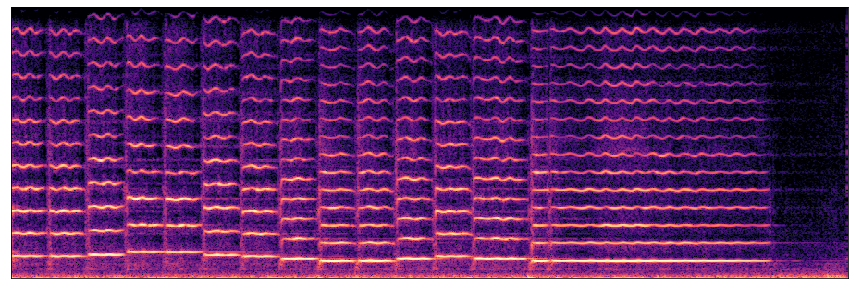

The output file is stored in  /content/midi-ddsp-output/ode_to_joy.wav


In [12]:
#@title MIDI-DDSP Inference

# If you have run the MIDI generation code, try to use the generated midi file:
# '/content/coconet-pytorch/results/generated_midi/harmonize_val_set_step_00000.mid'
# '/content/musenet-output0.mid'
# '/content/musenet-output1.mid'
# Note that this model can only generate a monophonic note sequence

# It takes 2.5x-5x realtime to synthesize
wav_filename = midi_ddsp_synth('/content/midi-ddsp/midi_example/ode_to_joy.mid', 'violin', plot=True, play=True)
print('The output file is stored in ', wav_filename)

# FluidSynth

Since the midi2paras model can not be successfully run, FluidSynth is used instead  
This is not a deep learning model, and is already used in Wei's MIDI generation part  
Here we wrap it as an independent function for the purpose of building a data pipeline

In [13]:
#@title Fluidsynth setup

# please first run the MIDI-DDSP setup

!pip install -q pretty_midi
!pip install -q pyfluidsynth
!apt install fluidsynth
import pretty_midi
import soundfile

def fluid_synth(midi_file, dir='/content/fluidsynth-output/', plot=False, play=False):
  
  # check if the input midi_file is a valid midi file
  if not (os.path.isfile(midi_file) and midi_file[-4:] == '.mid'):
    raise FileNotFoundError('Error: not a valid midi file')

  # if the output direction doesn't exist, create the direction
  if not os.path.isdir(dir):
    os.mkdir(dir)
  
  # load the midi data
  midi_data = pretty_midi.PrettyMIDI(midi_file)

  # synthesis
  sample_rate = 44100
  wav = midi_data.fluidsynth(fs=sample_rate)

  # plot the spectrogram if True
  if plot:
    plt.figure(figsize=(15,5))
    plot_spec(wav, sr=sample_rate)
    plt.show()

  # play the audio if True
  if play:
    sonify(wav, sr=sample_rate)
  
  # write the output file
  output_file = os.path.join(dir, os.path.basename(midi_file)[:-4]+'.wav')
  soundfile.write(output_file, wav, sample_rate)

  # return the path of the output file
  return output_file

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fluidsynth is already the newest version (1.1.9-1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 7 not upgraded.


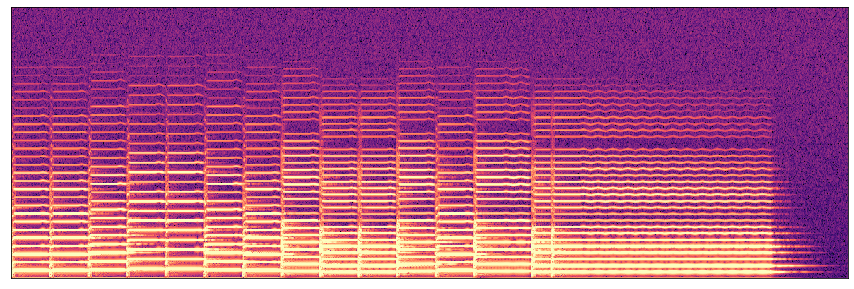

In [14]:
#@title Fluidsynth synthesis

# If you have run the MIDI generation code, try to use the generated midi file:
# '/content/coconet-pytorch/results/generated_midi/harmonize_val_set_step_00000.mid'
# '/content/musenet-output0.mid'
# '/content/musenet-output1.mid'

wav_filename = fluid_synth('/content/midi-ddsp/midi_example/ode_to_joy.mid', plot=True, play=True)

#Appendix

##Wei Shi particpated in the project scope refinement, coded the Accompaniment part and the Continuation part of the pipeline.

##Haokun Tian coded the Timbre Synthesis part of the pipeline.